# Stage 3 — CNN-SSM: full 2-D field prediction

Stage 2 proved the linear SSM can track the *scalar* summary statistics
(energy, enstrophy).  Stage 3 attacks the full 2-D fields:
**density**, **omega** (vorticity), and **phi** (electrostatic potential).

Architecture:
```
frame_t  (3, 128, 128)
    │
  CNNEncoder          ← compresses spatial structure into a latent vector
    │
  latent_t  (L=64,)
    │
  LinearSSM           ← learns temporal dynamics in latent space
    │
  latent_t+1_pred
    │
  CNNDecoder          ← expands latent back to full field
    │
  frame_t+1_pred  (3, 128, 128)
```

The interesting question is the same as Stage 2: **what does the SSM's
learned transition matrix $A$ look like** when it operates in the latent
space of a CNN trained on turbulent fields?


In [1]:
import sys
from pathlib import Path

def _find_pkg_root():
    for p in [Path.cwd(), *Path.cwd().parents]:
        if (p / 'hw2d_ssm' / 'data' / 'extract.py').exists():
            return p
    raise RuntimeError('Could not locate hw2d_ssm package root')

ROOT = _find_pkg_root()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

for mod in [m for m in list(sys.modules) if m == 'hw2d_ssm' or m.startswith('hw2d_ssm.')]:
    del sys.modules[mod]

import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import h5py

from lorenz_ssm.utils import pick_device
from hw2d_ssm.models.cnn_ssm import CNNSSM

DEVICE = pick_device(verbose=True)
H5_PATH = ROOT / 'hw2d_ssm' / 'hw2d_ssm' / 'data' / 'hw2d_medium.h5'
OUT_DIR = ROOT / 'hw2d_ssm' / 'outputs'
OUT_DIR.mkdir(exist_ok=True)
print('HDF5 path exists:', H5_PATH.exists())


[device] using cpu  (torch 2.12.0+cpu)
HDF5 path exists: True


## 1. Load the full 2-D fields

The HDF5 file stores `density`, `omega`, `phi` each at shape `(3201, 128, 128)`.
We stack them into a single `(T, 3, 128, 128)` array and normalise
per-channel using training-split statistics.

We drop the first 200 frames (transient build-up) — same convention as Stage 2.


In [2]:
DROP = 200   # discard transient warm-up frames

with h5py.File(H5_PATH, 'r') as hf:
    density  = np.asarray(hf['density'][DROP:],  dtype=np.float32)  # (T, 128, 128)
    omega    = np.asarray(hf['omega'][DROP:],    dtype=np.float32)
    phi      = np.asarray(hf['phi'][DROP:],      dtype=np.float32)
    frame_dt = float(hf.attrs.get('frame_dt', hf.attrs.get('dt', 1.0)))

# Stack → (T, 3, 128, 128)  channels: [density, omega, phi]
fields = np.stack([density, omega, phi], axis=1)
T_total = fields.shape[0]
print(f'fields shape: {fields.shape}   frame_dt={frame_dt}')

# Train/val split (temporal — no shuffle)
T_train = int(T_total * 0.8)
train_fields = fields[:T_train]
val_fields   = fields[T_train:]

# Per-channel normalisation from training set
ch_mean = train_fields.mean(axis=(0, 2, 3), keepdims=True)  # (1,3,1,1)
ch_std  = train_fields.std(axis=(0, 2, 3),  keepdims=True) + 1e-6
train_norm = (train_fields - ch_mean) / ch_std
val_norm   = (val_fields   - ch_mean) / ch_std

CHANNEL_NAMES = ['density', 'omega', 'phi']
for i, name in enumerate(CHANNEL_NAMES):
    print(f'  {name:8s}  mean={ch_mean[0,i,0,0]:.4f}  std={ch_std[0,i,0,0]:.4f}')


fields shape: (31801, 3, 128, 128)   frame_dt=0.25
  density   mean=0.0000  std=0.6900
  omega     mean=0.0000  std=6.6057
  phi       mean=0.0000  std=0.5234


In [3]:
def make_field_windows(frames, window=16, stride=2):
    """Slide a window of T consecutive frames along the time axis.
    Input:  (T, C, H, W)  →  Output: (N, window, C, H, W)
    """
    T = frames.shape[0]
    n = 1 + (T - window) // stride
    out = np.empty((n, window, *frames.shape[1:]), dtype=frames.dtype)
    for i in range(n):
        out[i] = frames[i * stride : i * stride + window]
    return out


def augment_batch(batch):
    """Random periodic cyclic shift + 90-degree rotation.

    Both are exact symmetries of the doubly-periodic HW2D domain, so
    augmented samples are physically valid trajectories.
    batch: (B, T, C, H, W) on any device.
    """
    import torch
    _, _, _, H, W = batch.shape
    sx = torch.randint(0, W, (1,)).item()
    sy = torch.randint(0, H, (1,)).item()
    batch = torch.roll(batch, shifts=(sy, sx), dims=(3, 4))
    k = torch.randint(0, 4, (1,)).item()
    if k:
        batch = torch.rot90(batch, k=k, dims=(3, 4))
    return batch


WINDOW = 16   # frames per window  (= 4 sim-units at frame_dt=0.25)
STRIDE = 2    # was 4 — halving stride ~doubles the training set

train_windows = make_field_windows(train_norm, WINDOW, STRIDE)
val_windows   = make_field_windows(val_norm,   WINDOW, STRIDE)
print(f'train windows: {train_windows.shape}   val windows: {val_windows.shape}')

# Keep train on CPU; move small batches to device inside the loop so
# augmentation is cheap and GPU memory stays flat.
train_t = torch.from_numpy(train_windows)          # CPU
val_t   = torch.from_numpy(val_windows).to(DEVICE) # GPU/MPS
print(f'train (CPU): {train_t.shape}')
print(f'val   ({val_t.device}): {val_t.shape}')


train windows: (12713, 16, 3, 128, 128)   val windows: (3173, 16, 3, 128, 128)
train (CPU): torch.Size([12713, 16, 3, 128, 128])
val   (cpu): torch.Size([3173, 16, 3, 128, 128])


## 2. Build and train the CNN-SSM

Architecture:
- **Encoder**: 4 stride-2 convolutions, 128→8, then linear → latent dim **256**  
- **SSM**: `LinearSSM` with state dim 128 operating in latent space  
- **Decoder**: mirror of encoder with transposed convolutions  

### Training strategy (two-phase)

**Phase 1 — AE pre-training**: train encoder + decoder alone with reconstruction
MSE.  This validates that the 256-dim latent can faithfully represent a turbulent
frame *before* we ask the SSM to do anything with it.

**Phase 2 — SSM fine-tuning**: freeze nothing, initialise the CNN weights from
Phase 1, and train the full system (encoder + SSM + decoder) end-to-end with
multi-step next-frame prediction loss.


In [4]:
LATENT_DIM  = 256
STATE_DIM   = 128
LR          = 3e-4
BATCH_SIZE  = 8

# Phase-1 settings
AE_EPOCHS   = 100   # autoencoder pre-training epochs
AE_PATIENCE = 15

# Phase-2 settings
SSM_EPOCHS    = 150
SSM_PATIENCE  = 15
MULTISTEP_K   = 4

from hw2d_ssm.models.cnn_ssm import CNNSSM, CNNEncoder, CNNDecoder

model = CNNSSM(in_channels=3, latent_dim=LATENT_DIM, state_dim=STATE_DIM).to(DEVICE)
n_params = sum(p.numel() for p in model.parameters())
print(f'Model parameters: {n_params:,}')
print(f'  Encoder: {sum(p.numel() for p in model.encoder.parameters()):,}')
print(f'  SSM:     {sum(p.numel() for p in model.ssm.parameters()):,}')
print(f'  Decoder: {sum(p.numel() for p in model.decoder.parameters()):,}')


Model parameters: 1,950,467
  Encoder: 952,928
  SSM:     36,864
  Decoder: 960,675


### Phase 1 — Autoencoder pre-training

Train **encoder + decoder only** with pixel MSE reconstruction loss.
The SSM is untouched in this phase.
Goal: confirm that a 256-dim latent can round-trip a turbulent frame faithfully.
We track per-channel reconstruction MSE so we can see if omega is still being
abandoned (it shouldn't be, now that the bottleneck is bigger).


In [ ]:
class AutoencoderOnly(nn.Module):
    """Thin wrapper that runs encoder → decoder for reconstruction."""
    def __init__(self, encoder, decoder):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, x):
        """x: (B, C, H, W) → recon: (B, C, H, W)"""
        return self.decoder(self.encoder(x))


ae = AutoencoderOnly(model.encoder, model.decoder)  # shares weights with model
ae_optim = torch.optim.AdamW(ae.parameters(), lr=LR, weight_decay=1e-4)
ae_sched = torch.optim.lr_scheduler.CosineAnnealingLR(ae_optim, T_max=AE_EPOCHS, eta_min=LR * 0.05)
ae_criterion = nn.MSELoss()

N_train = train_t.shape[0]
ae_train_hist, ae_val_hist = [], []
ae_best_val, ae_best_state, ae_patience_ctr = float('inf'), None, 0

print('── Phase 1: AE pre-training ──')
for ep in range(1, AE_EPOCHS + 1):
    ae.train()
    perm = torch.randperm(N_train)
    ep_losses = []
    for i in range(0, N_train, BATCH_SIZE):
        # Each window gives us T frames to reconstruct — flatten time into batch
        batch = train_t[perm[i : i + BATCH_SIZE]].to(DEVICE)  # (B, T, 3, H, W)
        batch = augment_batch(batch)
        B, T, C, H, W = batch.shape
        frames = batch.view(B * T, C, H, W)
        recon  = ae(frames)
        loss   = ae_criterion(recon, frames)
        ae_optim.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(ae.parameters(), 1.0)
        ae_optim.step()
        ep_losses.append(loss.item())
    ae_sched.step()

    tr = float(__import__('numpy').mean(ep_losses))
    ae_train_hist.append(tr)

    if ep % 5 == 0 or ep == 1:
        ae.eval()
        with torch.no_grad():
            vb = val_t[:32]                         # (32, T, 3, H, W)
            Bv, Tv, Cv, Hv, Wv = vb.shape
            vf = vb.view(Bv * Tv, Cv, Hv, Wv)
            vr = ae(vf)
            vl = ae_criterion(vr, vf).item()
            # Per-channel MSE for diagnostic
            ch_mse = [(vr[:, c] - vf[:, c]).pow(2).mean().item() for c in range(3)]
        ae_val_hist.append(vl)

        if vl < ae_best_val:
            ae_best_val = vl
            ae_best_state = {k: v.cpu().clone() for k, v in ae.state_dict().items()}
            ae_patience_ctr = 0
        else:
            ae_patience_ctr += 1

        ch_str = '  '.join(f'{n}={v:.3f}' for n, v in zip(CHANNEL_NAMES, ch_mse))
        marker = '  ← best' if ae_patience_ctr == 0 else f'  (no improve {ae_patience_ctr}/{AE_PATIENCE})'
        print(f'  ep {ep:4d}  recon {tr:.5f}  val {vl:.5f}  [{ch_str}]{marker}')

        if ae_patience_ctr >= AE_PATIENCE:
            print(f'AE early stop at epoch {ep} (best val={ae_best_val:.5f})')
            break

# Restore best AE weights into model.encoder / model.decoder
ae.load_state_dict({k: v.to(DEVICE) for k, v in ae_best_state.items()})
torch.save(ae_best_state, OUT_DIR / 'ae_pretrained.pt')
print(f'\nAE pre-training done. Best recon val MSE: {ae_best_val:.5f}')
print('Saved pre-trained AE weights →', OUT_DIR / 'ae_pretrained.pt')


In [ ]:
# Plot AE training curve + per-channel reconstruction on one example frame
fig, axes = plt.subplots(1, 2, figsize=(13, 3.5))

ax = axes[0]
ax.semilogy(ae_train_hist, label='train recon MSE', lw=1.2)
ax.semilogy(
    [ep * 5 for ep in range(len(ae_val_hist))],
    ae_val_hist, 'o--', label='val recon MSE', ms=4
)
ax.axhline(1.0, color='red', lw=0.8, ls=':', label='baseline (predict zero)')
ax.set_xlabel('epoch'); ax.set_ylabel('MSE (log scale)')
ax.set_title('AE pre-training curve'); ax.legend(); ax.grid(alpha=0.3)

# Per-channel true vs recon on one validation frame
ae.eval()
with torch.no_grad():
    sample_frame = val_t[0, 8].unsqueeze(0).to(DEVICE)    # (1, 3, 128, 128)
    recon_frame  = ae(sample_frame).squeeze(0).cpu().numpy()
true_frame = val_t[0, 8].cpu().numpy()

ax2 = axes[1]
ch_mse_show = [(recon_frame[c] - true_frame[c])**2 for c in range(3)]
ax2.bar(CHANNEL_NAMES, [m.mean() for m in ch_mse_show], color=['steelblue','coral','seagreen'])
ax2.axhline(1.0, color='red', lw=0.8, ls=':', label='baseline')
ax2.set_ylabel('reconstruction MSE (normalised)')
ax2.set_title('Per-channel recon MSE (one val frame)')
ax2.legend(); ax2.grid(alpha=0.3, axis='y')

fig.tight_layout()
fig.savefig(OUT_DIR / 'ae_pretrain_curve.png', dpi=150)
plt.show()
print('If all channels are well below 1.0, the representation is usable. Then Phase 2 begins.')


In [ ]:
# Helper (also used later) — define here so it's available for AE checks
def denorm(arr_norm):
    """arr_norm: numpy (..., 3, H, W)"""
    return arr_norm * ch_std[0] + ch_mean[0]

def plot_true_pred_error(true_frame, pred_frame, channel_names, title='', vmax_frac=0.95):
    """Plot 3 channels × 3 columns (true | pred | error) for one timestep."""
    n_ch = len(channel_names)
    fig, axes = plt.subplots(n_ch, 3, figsize=(11, 3.5 * n_ch))
    col_titles = ['True', 'Predicted', 'Error (true − pred)']
    for col, ctitle in enumerate(col_titles):
        axes[0, col].set_title(ctitle, fontsize=13, fontweight='bold')
    for row, name in enumerate(channel_names):
        tr  = true_frame[row]
        pr  = pred_frame[row]
        err = tr - pr
        vmax = np.percentile(np.abs(tr), vmax_frac * 100)
        kw  = dict(cmap='RdBu_r', vmin=-vmax, vmax=vmax, interpolation='nearest')
        ekw = dict(cmap='bwr', vmin=-vmax / 2, vmax=vmax / 2, interpolation='nearest')
        im0 = axes[row, 0].imshow(tr,  **kw)
        im1 = axes[row, 1].imshow(pr,  **kw)
        im2 = axes[row, 2].imshow(err, **ekw)
        for ax, im in zip(axes[row], [im0, im1, im2]):
            plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            ax.set_ylabel(name, fontsize=11)
            ax.set_xticks([]); ax.set_yticks([])
    if title:
        fig.suptitle(title, fontsize=14, y=1.01)
    fig.tight_layout()
    return fig


# Visual check: true vs AE reconstruction for all 3 channels
ae.eval()
with torch.no_grad():
    sample_frame = val_t[5, 8].unsqueeze(0).to(DEVICE)
    recon_frame  = ae(sample_frame).squeeze(0).cpu().numpy()
true_frame = val_t[5, 8].cpu().numpy()

fig = plot_true_pred_error(
    denorm(true_frame),
    denorm(recon_frame),
    CHANNEL_NAMES,
    title='AE reconstruction check (no SSM) — latent_dim=256'
)
fig.savefig(OUT_DIR / 'ae_recon_check.png', dpi=150, bbox_inches='tight')
plt.show()


### Phase 2 — SSM fine-tuning (end-to-end)

The encoder and decoder are initialised from Phase 1.  We now train the full
system (encoder + SSM + decoder) with multi-step next-frame prediction loss.
The SSM sees latent representations that are already meaningful, so it has a
real signal to learn dynamics from.


In [5]:
criterion = nn.MSELoss()

# AdamW: no weight decay on SSM matrices (would shrink eigenvalues toward zero)
ssm_params     = set(id(p) for p in model.ssm.parameters())
decay_params   = [p for p in model.parameters() if id(p) not in ssm_params]
nodecay_params = [p for p in model.parameters() if id(p) in ssm_params]
optim = torch.optim.AdamW([
    {'params': decay_params,   'weight_decay': 1e-4},
    {'params': nodecay_params, 'weight_decay': 0.0},
], lr=LR)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, T_max=SSM_EPOCHS, eta_min=LR * 0.05)

N_train = train_t.shape[0]
train_hist, val_hist = [], []
best_val, best_state, patience_ctr = float('inf'), None, 0

print('── Phase 2: SSM end-to-end fine-tuning ──')
for ep in range(1, SSM_EPOCHS + 1):
    model.train()
    perm = torch.randperm(N_train)
    ep_losses = []
    for i in range(0, N_train, BATCH_SIZE):
        batch = train_t[perm[i : i + BATCH_SIZE]].to(DEVICE)
        batch = augment_batch(batch)
        B, T, C, H, W = batch.shape
        latents = model.encoder(batch.view(B * T, C, H, W)).view(B, T, -1)
        loss = torch.tensor(0.0, device=DEVICE)
        h = torch.zeros(B, STATE_DIM, device=DEVICE, dtype=latents.dtype)
        for k in range(min(MULTISTEP_K, T - 1)):
            y, h = model.ssm.one_step(latents[:, k], h)
            pred_frame = model.decoder(y)
            loss = loss + criterion(pred_frame, batch[:, k + 1])
        loss = loss / min(MULTISTEP_K, T - 1)
        optim.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optim.step()
        ep_losses.append(loss.item())
    scheduler.step()

    tr = float(__import__('numpy').mean(ep_losses))
    train_hist.append(tr)

    if ep % 5 == 0 or ep == 1:
        model.eval()
        with torch.no_grad():
            vb = val_t[:16]
            Bv, Tv, Cv, Hv, Wv = vb.shape
            lat_v = model.encoder(vb.view(Bv * Tv, Cv, Hv, Wv)).view(Bv, Tv, -1)
            vl = 0.0
            hv = torch.zeros(Bv, STATE_DIM, device=DEVICE, dtype=lat_v.dtype)
            for k in range(min(MULTISTEP_K, Tv - 1)):
                yv, hv = model.ssm.one_step(lat_v[:, k], hv)
                vl += criterion(model.decoder(yv), vb[:, k + 1]).item()
            vl /= min(MULTISTEP_K, Tv - 1)
        val_hist.append(vl)

        if vl < best_val:
            best_val = vl
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            patience_ctr = 0
        else:
            patience_ctr += 1

        lr_now = optim.param_groups[0]['lr']
        marker = '  ← best' if patience_ctr == 0 else f'  (no improve {patience_ctr}/{SSM_PATIENCE})'
        print(f'  epoch {ep:4d}  train {tr:.5f}  val {vl:.5f}  lr={lr_now:.2e}{marker}')

        if patience_ctr >= SSM_PATIENCE:
            print(f'Early stop at epoch {ep} — restoring best weights (val={best_val:.5f})')
            model.load_state_dict({k: v.to(DEVICE) for k, v in best_state.items()})
            break

if best_state is not None and patience_ctr < SSM_PATIENCE:
    model.load_state_dict({k: v.to(DEVICE) for k, v in best_state.items()})

torch.save(model.state_dict(), OUT_DIR / 'cnn_ssm_v3.pt')
print('Saved to', OUT_DIR / 'cnn_ssm_v3.pt')


  epoch    1  train 0.89513  val 0.82877  lr=3.00e-04  ← best
  epoch    5  train 0.81625  val 0.80944  lr=2.99e-04  ← best
  epoch   10  train 0.81353  val 0.80550  lr=2.97e-04  ← best
  epoch   15  train 0.81195  val 0.80537  lr=2.93e-04  ← best
  epoch   20  train 0.81084  val 0.80157  lr=2.88e-04  ← best
  epoch   25  train 0.80948  val 0.80385  lr=2.81e-04  (no improve 1/15)
  epoch   30  train 0.80698  val 0.80013  lr=2.73e-04  ← best
  epoch   35  train 0.80372  val 0.79617  lr=2.63e-04  ← best
  epoch   40  train 0.79878  val 0.78982  lr=2.53e-04  ← best
  epoch   45  train 0.79430  val 0.77979  lr=2.41e-04  ← best
  epoch   50  train 0.79153  val 0.77913  lr=2.29e-04  ← best
  epoch   55  train 0.78906  val 0.78380  lr=2.15e-04  (no improve 1/15)
  epoch   60  train 0.78817  val 0.78163  lr=2.02e-04  (no improve 2/15)
  epoch   65  train 0.78663  val 0.78151  lr=1.87e-04  (no improve 3/15)
  epoch   70  train 0.78555  val 0.78146  lr=1.72e-04  (no improve 4/15)
  epoch   75  t

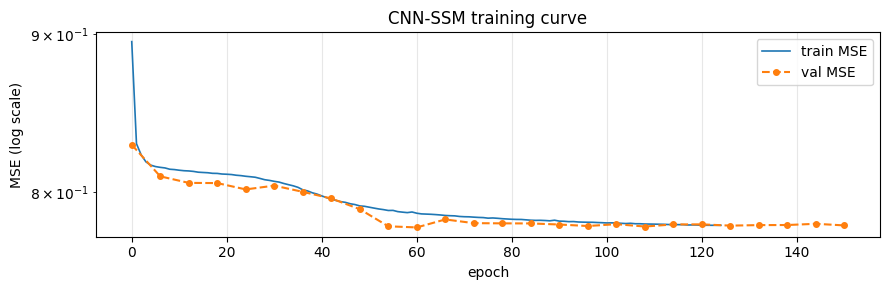

In [6]:
fig, ax = plt.subplots(figsize=(9, 3))
ax.semilogy(train_hist, label='train MSE', lw=1.2)
ax.semilogy(np.linspace(0, EPOCHS, len(val_hist)), val_hist, 'o--', label='val MSE', ms=4)
ax.set_xlabel('epoch'); ax.set_ylabel('MSE (log scale)')
ax.set_title('CNN-SSM training curve'); ax.legend(); ax.grid(alpha=0.3)
fig.tight_layout(); plt.show()


## 3. One-step prediction: true vs predicted fields

For a single validation window we show each of the 3 channels
side-by-side: **true** | **predicted** | **error**.  This reveals
which spatial structures the model recovers and where it fails.


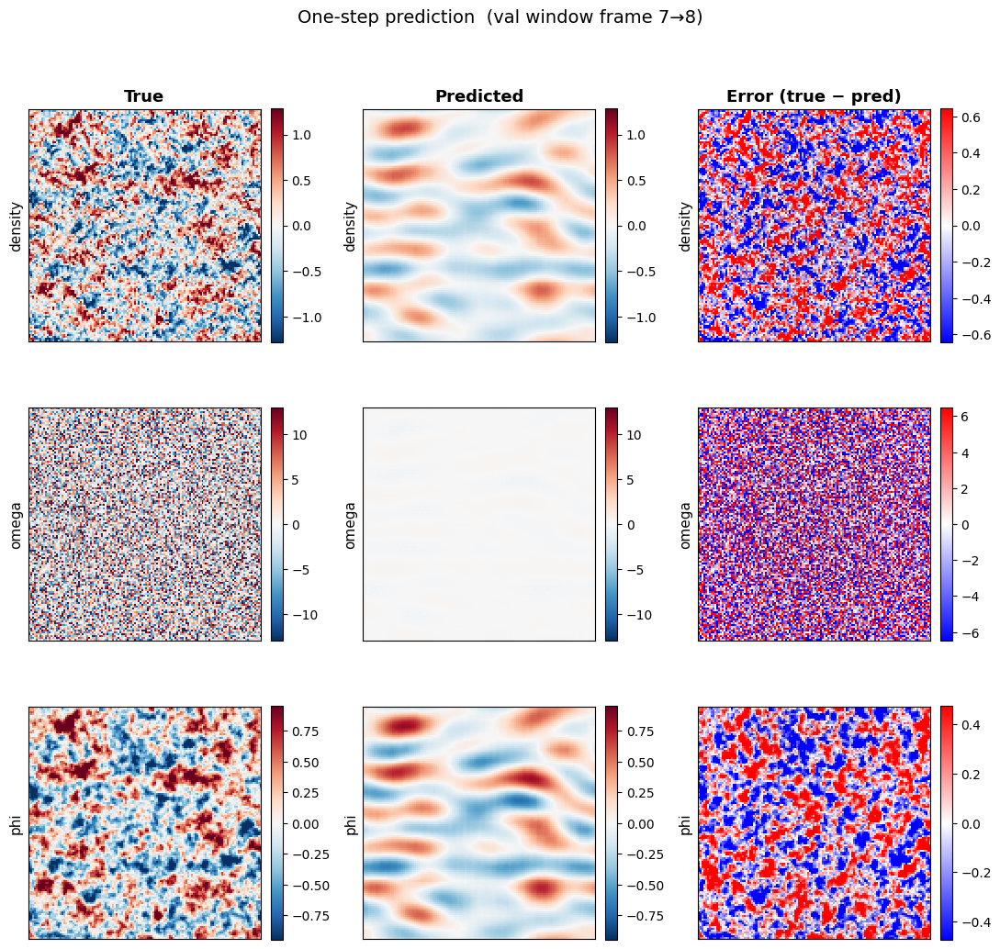

In [14]:
# One-step prediction: pick a validation window and run forward_sequence
model.eval()
sample = val_t[10:11]   # shape (1, 16, 3, 128, 128)
with torch.no_grad():
    pred_seq, _, _ = model.forward_sequence(sample)

true_seq = sample[0].cpu().numpy()           # (16, 3, 128, 128)  normalised
pred_seq = pred_seq[0].cpu().numpy()         # (15, 3, 128, 128)  normalised

# Show frame index 7 (middle of the window)
t_idx = 7
fig = plot_true_pred_error(
    denorm(true_seq[t_idx + 1]),
    denorm(pred_seq[t_idx]),
    CHANNEL_NAMES,
    title=f'One-step prediction  (val window frame {t_idx}→{t_idx+1})'
)
fig.savefig(OUT_DIR / 'cnn_ssm_one_step.png', dpi=150, bbox_inches='tight')
plt.show()


## 4. Autoregressive rollout — animated true vs predicted

Seed the model on the first 8 frames of a validation segment, then
let it predict the next 60 frames autoregressively.  The animation
shows **true** vs **predicted** side-by-side so you can watch the
turbulent structures evolve and diverge.


In [8]:
N_SEED  = 8    # warm-up frames
N_ROLL  = 60   # frames to generate autoregressively

# Use a contiguous segment of validation data
val_seg = val_norm[: N_SEED + N_ROLL]   # (68, 3, 128, 128) numpy
seed_t  = torch.from_numpy(val_seg[:N_SEED]).to(DEVICE)

pred_frames, pred_latents = model.rollout(seed_t, n_steps=N_ROLL)
# pred_frames: (N_ROLL, 3, 128, 128) CPU numpy after .numpy()
pred_np = pred_frames.numpy()       # normalised
true_np = val_seg[N_SEED:]         # normalised, same length

print(f'Rollout shape: {pred_np.shape}   True shape: {true_np.shape}')


Rollout shape: (60, 3, 128, 128)   True shape: (60, 3, 128, 128)


In [9]:
# ── Animation: true (top row) vs predicted (bottom row), one column per field ──

ANIM_CH = 1  # which channel to animate: 0=density, 1=omega, 2=phi
ch_name  = CHANNEL_NAMES[ANIM_CH]

fig, axes = plt.subplots(1, 3, figsize=(13, 4.5))
axes[0].set_title('True',       fontsize=12, fontweight='bold')
axes[1].set_title('Predicted',  fontsize=12, fontweight='bold')
axes[2].set_title('Error',      fontsize=12, fontweight='bold')
for ax in axes:
    ax.set_xticks([]); ax.set_yticks([])

# Colour scale from the whole true sequence
vmax = np.percentile(np.abs(true_np[:, ANIM_CH]), 98)
kw   = dict(cmap='RdBu_r', vmin=-vmax, vmax=vmax, animated=True, interpolation='nearest')
ekw  = dict(cmap='bwr',    vmin=-vmax/2, vmax=vmax/2, animated=True, interpolation='nearest')

im0 = axes[0].imshow(true_np[0, ANIM_CH],                        **kw)
im1 = axes[1].imshow(pred_np[0, ANIM_CH],                        **kw)
im2 = axes[2].imshow(true_np[0, ANIM_CH] - pred_np[0, ANIM_CH], **ekw)
plt.colorbar(im0, ax=axes[0], fraction=0.046)
plt.colorbar(im1, ax=axes[1], fraction=0.046)
plt.colorbar(im2, ax=axes[2], fraction=0.046)

time_text = fig.text(0.5, 0.97, '', ha='center', va='top', fontsize=11)
fig.suptitle(f'CNN-SSM autoregressive rollout  [{ch_name}]', fontsize=13, y=1.03)
fig.tight_layout()

def _update(frame_idx):
    tr  = true_np[frame_idx, ANIM_CH]
    pr  = pred_np[frame_idx, ANIM_CH]
    im0.set_data(tr)
    im1.set_data(pr)
    im2.set_data(tr - pr)
    t_phys = (N_SEED + frame_idx) * frame_dt
    time_text.set_text(f't = {t_phys:.2f}  (rollout step {frame_idx + 1}/{N_ROLL})')
    return im0, im1, im2, time_text

anim = animation.FuncAnimation(
    fig, _update, frames=N_ROLL, interval=120, blit=True
)
plt.close(fig)   # prevent duplicate static display
HTML(anim.to_jshtml())


In [10]:
# Save animation as gif (optional — takes ~30 s)
gif_path = OUT_DIR / f'cnn_ssm_rollout_{ch_name}.gif'
anim.save(gif_path, writer='pillow', fps=8, dpi=120)
print('Saved:', gif_path)


Saved: c:\Users\scsla\OneDrive\Documents\Harris\TOY-SSM\hw2d_ssm\outputs\cnn_ssm_rollout_omega.gif


## 5. Rollout error over time

How fast does the prediction diverge?  Plot the per-frame spatial MSE
as a function of rollout step — the slope tells you the effective
predictability horizon of the model.


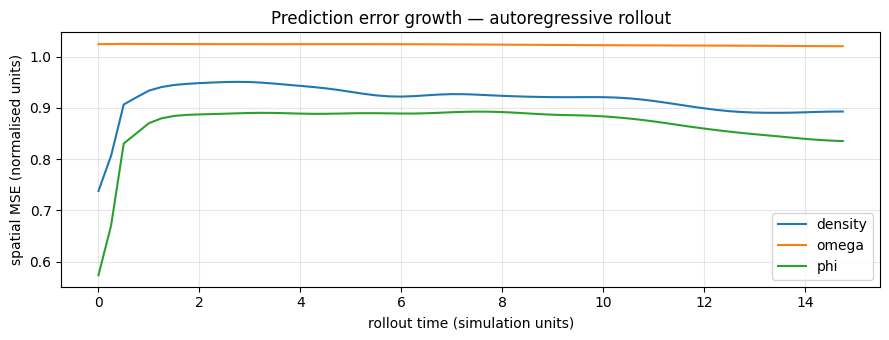

In [11]:
# Per-step MSE for each channel
sq_err = (true_np - pred_np) ** 2   # (N_ROLL, 3, 128, 128)
mse_per_step = sq_err.mean(axis=(2, 3))   # (N_ROLL, 3)

times_roll = np.arange(N_ROLL) * frame_dt

fig, ax = plt.subplots(figsize=(9, 3.5))
for i, name in enumerate(CHANNEL_NAMES):
    ax.plot(times_roll, mse_per_step[:, i], label=name, lw=1.5)
ax.set_xlabel('rollout time (simulation units)')
ax.set_ylabel('spatial MSE (normalised units)')
ax.set_title('Prediction error growth — autoregressive rollout')
ax.legend(); ax.grid(alpha=0.3)
fig.tight_layout()
fig.savefig(OUT_DIR / 'cnn_ssm_error_growth.png', dpi=150)
plt.show()


## 6. Latent space — PCA of hidden states

Collect the latent vectors produced by the encoder on the full validation
segment, then project to 2-D with PCA and colour each point by the true
energy at that timestep.  If the CNN-SSM has learned meaningful structure,
you should see the latent trajectory organised by turbulence intensity.


PCA explained variance: PC1=13.9%  PC2=12.4%


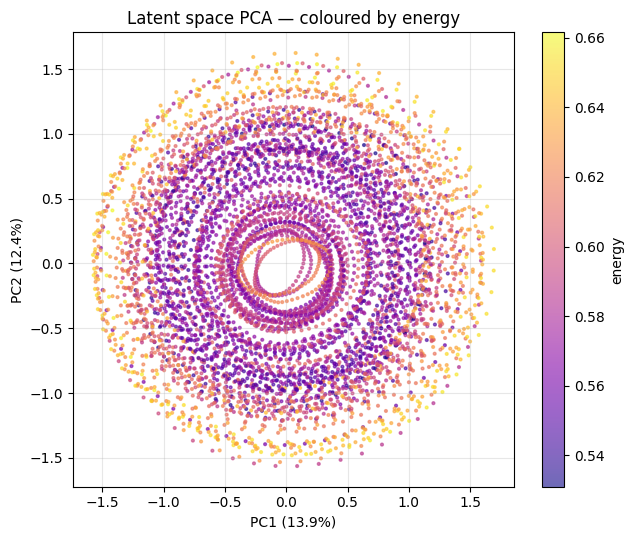

In [12]:
from sklearn.decomposition import PCA

# Encode all validation frames
model.eval()
val_frames_t = torch.from_numpy(val_norm).to(DEVICE)   # (T_val, 3, 128, 128)
with torch.no_grad():
    CHUNK = 64   # avoid OOM on long sequences
    latents_all = torch.cat([
        model.encoder(val_frames_t[i : i + CHUNK])
        for i in range(0, len(val_frames_t), CHUNK)
    ]).cpu().numpy()   # (T_val, 64)

# Load matching energy for colour axis
with h5py.File(H5_PATH, 'r') as hf:
    energy_val = np.asarray(hf['energy'][DROP + T_train :], dtype=np.float32)
energy_val = energy_val[:len(latents_all)]

pca = PCA(n_components=2)
Z2  = pca.fit_transform(latents_all)
var = pca.explained_variance_ratio_
print(f'PCA explained variance: PC1={var[0]:.1%}  PC2={var[1]:.1%}')

fig, ax = plt.subplots(figsize=(6.5, 5.5))
sc = ax.scatter(Z2[:, 0], Z2[:, 1], c=energy_val, cmap='plasma',
                s=4, alpha=0.6, rasterized=True)
plt.colorbar(sc, ax=ax, label='energy')
ax.set_xlabel(f'PC1 ({var[0]:.1%})')
ax.set_ylabel(f'PC2 ({var[1]:.1%})')
ax.set_title('Latent space PCA — coloured by energy')
ax.grid(alpha=0.3)
fig.tight_layout()
fig.savefig(OUT_DIR / 'cnn_ssm_latent_pca.png', dpi=150)
plt.show()


## 7. Eigenvalues of the learned SSM transition matrix $A$

The SSM in Stage 3 operates in *latent* space, so its $A$ matrix encodes
the timescales present in the compressed turbulent field — not the raw
scalars from Stage 2.  How does it compare?


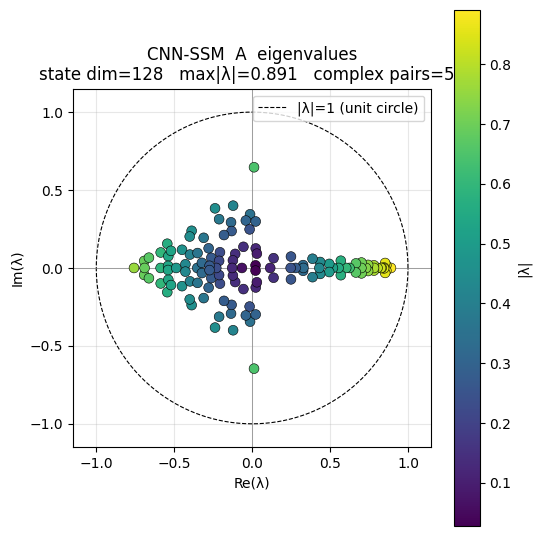

In [13]:
A_cnn = model.ssm.A.detach().cpu().numpy()
eig   = np.linalg.eigvals(A_cnn)
theta = np.linspace(0, 2 * np.pi, 300)

fig, ax = plt.subplots(figsize=(5.5, 5.5))
sc = ax.scatter(eig.real, eig.imag,
                c=np.abs(eig), cmap='viridis',
                s=50, edgecolors='k', linewidths=0.4, zorder=3)
plt.colorbar(sc, ax=ax, label='|λ|')
ax.plot(np.cos(theta), np.sin(theta), 'k--', lw=0.8, label='|λ|=1 (unit circle)')
ax.axhline(0, color='gray', lw=0.5); ax.axvline(0, color='gray', lw=0.5)
ax.set_aspect('equal')
ax.set_xlim(-1.15, 1.15); ax.set_ylim(-1.15, 1.15)
ax.grid(alpha=0.3)
n_complex = int((np.abs(eig.imag) > 1e-6).sum() // 2)
ax.set_title(
    f'CNN-SSM  A  eigenvalues\n'
    f'state dim={STATE_DIM}   max|λ|={np.abs(eig).max():.3f}   '
    f'complex pairs={n_complex}'
)
ax.set_xlabel('Re(λ)'); ax.set_ylabel('Im(λ)')
ax.legend(loc='upper right')
fig.tight_layout()
fig.savefig(OUT_DIR / 'cnn_ssm_eigenvalues.png', dpi=150)
plt.show()
